In [ ]:
# -- example on using 'messycharts' chart tool

# -- notebook details

In [40]:
# -- folder requirements 

"""
- main 
  |
  |-- /charts        -- folder to store chart outputs 
  |
  |-- notebook.ipynb -- script to collect data and build slides with messaychart tool 
  |
  |-- messycharts.py -- chart tool for building messari slides 

""";

In [ ]:
# -- packages 

# -- Messari (only need for data collection)
# -- Pillow 
# -- Pandas 
# -- Plotly

# -- messycharts (file)


# -- import

In [100]:
import pandas as pd 

from datetime import date
import datetime

import time

import requests
import os

In [3]:
from importlib import reload

import messycharts 
reload(messycharts)

from messycharts import messychart

In [4]:
from messari.messari import Messari
from messari.coingecko import CoinGecko
from messari.defillama import DeFiLlama
from messari.nfts import NFTPriceFloor
from messari.tokenterminal import TokenTerminal

messari = Messari('3c5078e6-c460-496f-8035-2062fabb8ed9')
#messari = Messari(os.getenv('MESSARI_API'))
coingecko = CoinGecko()
defillama = DeFiLlama()
floor = NFTPriceFloor()
tokenterminal = TokenTerminal(api_key='610b30be-e8b5-4b64-a27d-d59c94132ee4')
#tokenterminal = TokenTerminal(api_key=os.getenv('TOKEN_TERMINAL_API'))

# -- Report Set up

In [ ]:
report_title = 'Layer-1'

filepath_chart = '/home/runner/Messari-Reports/charts/' + report_title.lower() + '/'
filepath_data =  '/home/runner/Messari-Reports/data/'   + report_title.lower() + '/'

today = date.today()
today_str = today.strftime("%Y-%m-%d")

date_ranges = [30,90,180,365, 999]

# -- get data: TVL

In [169]:
chains = ['Ethereum', 'Solana', "Avalanche", "Polygon", 'Arbitrum', 'Optimism', 'Fantom', 'Near', 'BSC']
chain_tvls = defillama.get_chain_tvl_timeseries(chains, start_date="2021-01-01", end_date=today_str)
chain_tvls

,Ethereum,Solana,Avalanche,Polygon,Arbitrum,Optimism,Fantom,Near,BSC
2021-01-01,1.745434e+10,NaN,NaN,3.247274e+05,1.204762e+07,NaN,NaN,NaN,1.519984e+08
2021-01-02,1.748414e+10,NaN,NaN,3.135262e+05,1.218382e+07,NaN,NaN,NaN,1.708966e+08
2021-01-03,1.786076e+10,NaN,NaN,3.194089e+05,1.222715e+07,NaN,NaN,NaN,1.619157e+08
2021-01-04,1.964954e+10,NaN,NaN,3.050798e+05,1.345183e+07,NaN,NaN,NaN,1.874533e+08
2021-01-05,2.052667e+10,NaN,NaN,3.113200e+05,1.222600e+07,NaN,NaN,NaN,2.049293e+08
...,...,...,...,...,...,...,...,...,...
2022-09-20,4.705392e+10,2.010227e+09,1.971446e+09,1.482345e+09,9.850357e+08,9.236190e+08,6.384593e+08,3.554208e+08,6.348369e+09
2022-09-21,4.720758e+10,1.977695e+09,1.931974e+09,1.471199e+09,9.729398e+08,9.351478e+08,6.456977e+08,3.429665e+08,6.364034e+09
2022-09-22,4.563462e+10,1.936765e+09,1.909493e+09,1.416360e+09,9.569640e+08,9.011293e+08,6.226322e+08,3.337781e+08,6.375710e+09
2022-09-23,4.813352e+10,2.003761e+09,1.943080e+09,1.441050e+09,9.981262e+08,9.254300e+08,6.413386e+08,3.412429e+08,6.508040e+09


In [170]:
cosmos_chains = ['cosmos', 'osmosis', 'cronos', 'evmos', 'thorchain', 'kava', 'juno', 'secret', 'canto']
cosmos_tvls = defillama.get_chain_tvl_timeseries(cosmos_chains, start_date="2021-01-01", end_date=today_str)
cosmos_tvls

,cosmos,osmosis,cronos,evmos,thorchain,kava,juno,secret,canto
2021-01-01,NaN,NaN,NaN,NaN,NaN,9.249044e+07,NaN,NaN,NaN
2021-01-02,NaN,NaN,NaN,NaN,NaN,9.361601e+07,NaN,NaN,NaN
2021-01-03,NaN,NaN,NaN,NaN,NaN,9.322707e+07,NaN,NaN,NaN
2021-01-04,NaN,NaN,NaN,NaN,NaN,9.696474e+07,NaN,NaN,NaN
2021-01-05,NaN,NaN,NaN,NaN,NaN,9.115209e+07,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2022-09-20,636642.5373,2.457118e+08,7.586291e+08,1.708160e+06,1.116598e+08,2.766191e+08,2.939463e+07,1.065749e+07,6.889183e+07
2022-09-21,568796.2320,2.270668e+08,7.550264e+08,1.580400e+06,1.087038e+08,2.731492e+08,2.660802e+07,1.015890e+07,6.200928e+07
2022-09-22,545447.9952,2.201009e+08,7.465058e+08,1.633405e+06,1.048381e+08,2.722830e+08,2.606124e+07,1.009377e+07,6.290652e+07
2022-09-23,608402.9575,2.329206e+08,7.652399e+08,1.659162e+06,1.088137e+08,2.863539e+08,2.829157e+07,1.021296e+07,6.351510e+07


In [171]:
cosmos_tvls['Cosmos'] = cosmos_tvls.sum(axis=1)
cosmos_tvls

,cosmos,osmosis,cronos,evmos,thorchain,kava,juno,secret,canto,Cosmos
2021-01-01,NaN,NaN,NaN,NaN,NaN,9.249044e+07,NaN,NaN,NaN,9.249044e+07
2021-01-02,NaN,NaN,NaN,NaN,NaN,9.361601e+07,NaN,NaN,NaN,9.361601e+07
2021-01-03,NaN,NaN,NaN,NaN,NaN,9.322707e+07,NaN,NaN,NaN,9.322707e+07
2021-01-04,NaN,NaN,NaN,NaN,NaN,9.696474e+07,NaN,NaN,NaN,9.696474e+07
2021-01-05,NaN,NaN,NaN,NaN,NaN,9.115209e+07,NaN,NaN,NaN,9.115209e+07
...,...,...,...,...,...,...,...,...,...,...
2022-09-20,636642.5373,2.457118e+08,7.586291e+08,1.708160e+06,1.116598e+08,2.766191e+08,2.939463e+07,1.065749e+07,6.889183e+07,1.503909e+09
2022-09-21,568796.2320,2.270668e+08,7.550264e+08,1.580400e+06,1.087038e+08,2.731492e+08,2.660802e+07,1.015890e+07,6.200928e+07,1.464872e+09
2022-09-22,545447.9952,2.201009e+08,7.465058e+08,1.633405e+06,1.048381e+08,2.722830e+08,2.606124e+07,1.009377e+07,6.290652e+07,1.444968e+09
2022-09-23,608402.9575,2.329206e+08,7.652399e+08,1.659162e+06,1.088137e+08,2.863539e+08,2.829157e+07,1.021296e+07,6.351510e+07,1.497615e+09


In [172]:
chain_tvls = chain_tvls.join(cosmos_tvls['Cosmos'])

In [174]:
chain_tvls

,Ethereum,Solana,Avalanche,Polygon,Arbitrum,Optimism,Fantom,Near,BSC,Cosmos
2021-01-01,1.745434e+10,NaN,NaN,3.247274e+05,1.204762e+07,NaN,NaN,NaN,1.519984e+08,9.249044e+07
2021-01-02,1.748414e+10,NaN,NaN,3.135262e+05,1.218382e+07,NaN,NaN,NaN,1.708966e+08,9.361601e+07
2021-01-03,1.786076e+10,NaN,NaN,3.194089e+05,1.222715e+07,NaN,NaN,NaN,1.619157e+08,9.322707e+07
2021-01-04,1.964954e+10,NaN,NaN,3.050798e+05,1.345183e+07,NaN,NaN,NaN,1.874533e+08,9.696474e+07
2021-01-05,2.052667e+10,NaN,NaN,3.113200e+05,1.222600e+07,NaN,NaN,NaN,2.049293e+08,9.115209e+07
...,...,...,...,...,...,...,...,...,...,...
2022-09-20,4.705392e+10,2.010227e+09,1.971446e+09,1.482345e+09,9.850357e+08,9.236190e+08,6.384593e+08,3.554208e+08,6.348369e+09,1.503909e+09
2022-09-21,4.720758e+10,1.977695e+09,1.931974e+09,1.471199e+09,9.729398e+08,9.351478e+08,6.456977e+08,3.429665e+08,6.364034e+09,1.464872e+09
2022-09-22,4.563462e+10,1.936765e+09,1.909493e+09,1.416360e+09,9.569640e+08,9.011293e+08,6.226322e+08,3.337781e+08,6.375710e+09,1.444968e+09
2022-09-23,4.813352e+10,2.003761e+09,1.943080e+09,1.441050e+09,9.981262e+08,9.254300e+08,6.413386e+08,3.412429e+08,6.508040e+09,1.497615e+09


# -- Get Data: Market Cap

In [51]:
now = datetime.datetime.now()
timestamp = round(datetime.datetime.timestamp(now))

1664033938

In [86]:
slug_fixes = {
  'avalanche': 'avalanche-2',
  'bsc': 'binancecoin',
  'polygon': 'matic-network',
  'juno': 'juno-network'
}

In [189]:
for i, chain in enumerate(chains): 
  try: 
    slug = slug_fixes[chain.lower()] if chain.lower() in slug_fixes.keys() else chain.lower() 

    chain_df = coingecko.get_coin_range(slug, _from = 1609459200, to = timestamp )
    time.sleep(5)

    if i == 0: 
      mcap_df = chain_df['market_caps'].to_frame()
      mcap_df.columns = [chain]

    else: 
      temp_df = chain_df['market_caps'].to_frame()
      temp_df.columns = [chain]
      mcap_df = mcap_df.join(temp_df)

  except: 
    None 

In [190]:
for i, chain in enumerate(cosmos_chains): 
  try: 
    slug = slug_fixes[chain.lower()] if chain.lower() in slug_fixes.keys() else chain.lower() 

    chain_df = coingecko.get_coin_range(slug, _from = 1609459200, to = timestamp )
    time.sleep(5)

    if i == 0: 
      cosmos_df = chain_df['market_caps'].to_frame()
      cosmos_df.columns = [chain]

    else: 
      temp_df = chain_df['market_caps'].to_frame()
      temp_df.columns = [chain]
      cosmos_df = cosmos_df.join(temp_df)

  except: 
    None 

In [191]:
cosmos_df['Cosmos'] = cosmos_df.sum(axis=1)
mcap_df = mcap_df.join(cosmos_df['Cosmos'])

In [ ]:
mcap_df.index.rename('date')

In [192]:
mcap_df

,Ethereum,Solana,Avalanche,Polygon,Optimism,Fantom,Near,BSC,Cosmos
prices,,,,,,,,,
2021-01-01,8.403769e+10,6.976680e+07,2.345197e+08,8.463121e+07,NaN,4.281446e+07,3.344094e+08,5.507756e+09,1.886293e+09
2021-01-02,8.329408e+10,8.631814e+07,2.841238e+08,8.549727e+07,NaN,4.356394e+07,3.253269e+08,5.584591e+09,1.780027e+09
2021-01-03,8.859535e+10,8.408647e+07,2.697520e+08,9.123957e+07,NaN,4.165619e+07,3.406174e+08,5.664993e+09,1.668376e+09
2021-01-04,1.125254e+11,9.977534e+07,2.713193e+08,9.773162e+07,NaN,4.850544e+07,3.586828e+08,6.162622e+09,1.828087e+09
2021-01-05,1.166932e+11,1.117991e+08,2.719010e+08,1.139679e+08,NaN,5.072508e+07,3.290102e+08,5.860212e+09,1.829873e+09
...,...,...,...,...,...,...,...,...,...
2022-09-20,1.663702e+11,1.159881e+10,5.128127e+09,5.719295e+09,2.057920e+08,5.869648e+08,3.199823e+09,4.447633e+10,7.122521e+09
2022-09-21,1.598441e+11,1.113615e+10,4.932167e+09,5.453960e+09,1.979666e+08,5.748768e+08,3.011449e+09,4.353704e+10,6.438879e+09
2022-09-22,1.510846e+11,1.092017e+10,4.903381e+09,5.242222e+09,1.920102e+08,5.605847e+08,2.871974e+09,4.319255e+10,6.222128e+09


In [193]:
mcap_df.reset_index()

,prices,Ethereum,Solana,Avalanche,Polygon,Optimism,Fantom,Near,BSC,Cosmos
0,2021-01-01,8.403769e+10,6.976680e+07,2.345197e+08,8.463121e+07,NaN,4.281446e+07,3.344094e+08,5.507756e+09,1.886293e+09
1,2021-01-02,8.329408e+10,8.631814e+07,2.841238e+08,8.549727e+07,NaN,4.356394e+07,3.253269e+08,5.584591e+09,1.780027e+09
2,2021-01-03,8.859535e+10,8.408647e+07,2.697520e+08,9.123957e+07,NaN,4.165619e+07,3.406174e+08,5.664993e+09,1.668376e+09
3,2021-01-04,1.125254e+11,9.977534e+07,2.713193e+08,9.773162e+07,NaN,4.850544e+07,3.586828e+08,6.162622e+09,1.828087e+09
4,2021-01-05,1.166932e+11,1.117991e+08,2.719010e+08,1.139679e+08,NaN,5.072508e+07,3.290102e+08,5.860212e+09,1.829873e+09
...,...,...,...,...,...,...,...,...,...,...
627,2022-09-20,1.663702e+11,1.159881e+10,5.128127e+09,5.719295e+09,2.057920e+08,5.869648e+08,3.199823e+09,4.447633e+10,7.122521e+09
628,2022-09-21,1.598441e+11,1.113615e+10,4.932167e+09,5.453960e+09,1.979666e+08,5.748768e+08,3.011449e+09,4.353704e+10,6.438879e+09
629,2022-09-22,1.510846e+11,1.092017e+10,4.903381e+09,5.242222e+09,1.920102e+08,5.605847e+08,2.871974e+09,4.319255e+10,6.222128e+09
630,2022-09-23,1.604151e+11,1.148964e+10,5.228727e+09,5.610634e+09,2.014466e+08,5.917448e+08,3.048776e+09,4.498157e+10,6.681354e+09


In [75]:
for i, chain in enumerate(chains): 
  print(chain.lower())

ethereum
solana
avalanche
polygon
arbitrum
optimism
fantom
near
bsc


In [93]:
# -- example code: alt way of getting market cap. Data more spotty than coingecko (coingecko wayyy slower tho)
metric = 'mcap.circ'
start = '2021-01-01'
end = today_str
timeseries_df = messari.get_metric_timeseries(asset_slugs=chains, asset_metric=metric, start=start, end=end)
timeseries_df

,Ethereum,Solana,Avalanche,Polygon,Optimism,Fantom,Near,BSC
timestamp,,,,,,,,
2021-01-01,8.337198e+10,7.040172e+07,2.449797e+08,8.493905e+07,NaN,4.304300e+07,3.345040e+08,NaN
2021-01-02,8.263192e+10,8.581717e+07,2.828888e+08,8.543673e+07,NaN,4.391492e+07,3.276343e+08,NaN
2021-01-03,8.771298e+10,8.387149e+07,2.690413e+08,9.216879e+07,NaN,4.179101e+07,3.420633e+08,NaN
2021-01-04,1.104096e+11,1.010650e+08,2.675542e+08,9.580768e+07,NaN,4.823173e+07,3.583162e+08,7420.481542
2021-01-05,1.177880e+11,1.161215e+08,2.772032e+08,1.186464e+08,NaN,5.210246e+07,3.377750e+08,8663.869099
...,...,...,...,...,...,...,...,...
2022-09-20,1.684933e+11,1.155213e+10,5.111844e+09,6.685815e+09,2.046883e+08,5.857110e+08,3.192514e+09,NaN
2022-09-21,1.620072e+11,1.112849e+10,4.925794e+09,6.405340e+09,1.973367e+08,5.752225e+08,3.007985e+09,NaN
2022-09-22,1.525634e+11,1.086847e+10,4.893776e+09,6.118934e+09,1.913753e+08,5.594476e+08,2.866720e+09,NaN


# -- Get Data: Daily Active Addresses + Alt Data

In [102]:
start = date(2021, 1, 1)
delta = today - start
days_back = delta.days


In [106]:
# -- daily active addresses 
url_daa = f'https://api.gokustats.xyz/daily-active-addresses/?daysBack={days_back}&percentChange=false&baseCurrency=USD'

resp = requests.get(url_daa)
daa_raw = resp.json()

daa_df = pd.DataFrame(daa_raw)

daa_df['date'] = pd.to_datetime(daa_df['date'])
daa_df.set_index('date', inplace= True)

daa_df

,arbitrum,avalanche,bsc,cosmoshub,ethereum,flow,near,optimism,osmosis,polygon,solana
date,,,,,,,,,,,
2021-01-01,NaN,22.0,49561.0,2281.0,441169.0,124.0,428.0,NaN,NaN,759.0,681.0
2021-01-02,NaN,8.0,37904.0,2274.0,420530.0,164.0,462.0,NaN,NaN,707.0,796.0
2021-01-03,NaN,4.0,35151.0,2626.0,488930.0,531.0,388.0,NaN,NaN,724.0,882.0
2021-01-04,NaN,12.0,35476.0,2535.0,511899.0,180.0,509.0,NaN,NaN,670.0,729.0
2021-01-05,NaN,4.0,32959.0,2463.0,504191.0,634.0,498.0,NaN,NaN,972.0,902.0
...,...,...,...,...,...,...,...,...,...,...,...
2022-09-19,33360.0,42767.0,921885.0,17377.0,451302.0,45714.0,118653.0,12016.0,23169.0,330817.0,765224.0
2022-09-20,38862.0,40315.0,912560.0,15292.0,458608.0,72505.0,112392.0,20656.0,21276.0,297570.0,810548.0
2022-09-21,37186.0,41507.0,887212.0,14288.0,448349.0,43396.0,114289.0,31413.0,21271.0,309180.0,760178.0


In [260]:
daa_df['cosmos'] = daa_df['cosmoshub'] + daa_df['osmosis']
daa_df = daa_df.drop(columns=['flow', 'osmosis', 'cosmoshub'])

In [107]:
# -- daily txns
url_txns = f'https://api.gokustats.xyz/daily-transactions/?daysBack={days_back}&percentChange=false&baseCurrency=USD'

resp = requests.get(url_txns)
txns_raw = resp.json()

txns_df = pd.DataFrame(txns_raw)

txns_df['date'] = pd.to_datetime(txns_df['date'])
txns_df.set_index('date', inplace= True)

txns_df

,arbitrum,avalanche,bsc,cosmoshub,ethereum,flow,near,optimism,osmosis,polygon,solana
date,,,,,,,,,,,
2021-01-01,NaN,1846.0,351731.0,7030.0,1126605.0,5959.0,5582.0,NaN,NaN,34065.0,22987820.0
2021-01-02,NaN,11.0,349435.0,7615.0,1159038.0,9099.0,5203.0,NaN,NaN,39240.0,24241457.0
2021-01-03,NaN,39.0,388973.0,7507.0,1220944.0,8238.0,7478.0,NaN,NaN,40248.0,25585919.0
2021-01-04,NaN,16.0,419057.0,7818.0,1260300.0,7695.0,7733.0,NaN,NaN,46316.0,30733818.0
2021-01-05,NaN,1.0,386939.0,7315.0,1244603.0,13484.0,7460.0,NaN,NaN,44223.0,32864123.0
...,...,...,...,...,...,...,...,...,...,...,...
2022-09-19,348682.0,3467928.0,3279108.0,44588.0,1121066.0,1006214.0,725201.0,148851.0,111725.0,2644039.0,33779192.0
2022-09-20,458385.0,2848828.0,3143998.0,39802.0,1134614.0,1077503.0,720639.0,226927.0,114552.0,2602463.0,33795073.0
2022-09-21,511741.0,2483853.0,3226391.0,38665.0,1083452.0,1199434.0,700700.0,348095.0,138712.0,2935429.0,29408184.0


In [259]:

txns_df['cosmos'] = txns_df['cosmoshub'] + txns_df['osmosis']
txns_df = txns_df.drop(columns=['flow', 'osmosis', 'cosmoshub'])

In [108]:
# -- twitter followers 
url_twit = f'https://api.gokustats.xyz/cumulative-twitter-followers/?daysBack={days_back}&percentChange=false&baseCurrency=USD'

resp = requests.get(url_twit)
twit_raw = resp.json()

twit_df = pd.DataFrame(twit_raw)

twit_df['date'] = pd.to_datetime(twit_df['date'])
twit_df.set_index('date', inplace= True)

twit_df

,avalanche,bsc,cosmoshub,ethereum,flow,near,osmosis,polygon,solana
date,,,,,,,,,
2021-01-01,22461.0,1440343.0,47115.0,548211.0,NaN,34350.0,NaN,NaN,105101.0
2021-01-02,22487.0,1447099.0,47147.0,550791.0,NaN,34352.0,NaN,NaN,105142.0
2021-01-03,NaN,1452493.0,NaN,553813.0,NaN,NaN,NaN,NaN,NaN
2021-01-04,NaN,1457313.0,47299.0,556815.0,NaN,NaN,NaN,NaN,NaN
2021-01-05,NaN,1460211.0,47390.0,562561.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2022-09-19,758448.0,9481701.0,466853.0,2873641.0,184735.0,609891.0,135216.0,1653172.0,2042210.0
2022-09-20,758886.0,9482403.0,467068.0,2874713.0,184833.0,610332.0,135285.0,1653637.0,2042375.0
2022-09-21,759599.0,9486922.0,467317.0,2876230.0,185282.0,611780.0,135333.0,1654261.0,2042911.0


In [256]:
twit_df.rename(columns={'cosmoshub':'cosmos'}, inplace=True)
twit_df = twit_df.drop(columns=['flow', 'osmosis'])

In [257]:
twit_df

,avalanche,bsc,cosmos,ethereum,near,polygon,solana
date,,,,,,,
2021-01-01,22461.0,1440343.0,47115.0,548211.0,34350.0,NaN,105101.0
2021-01-02,22487.0,1447099.0,47147.0,550791.0,34352.0,NaN,105142.0
2021-01-03,NaN,1452493.0,NaN,553813.0,NaN,NaN,NaN
2021-01-04,NaN,1457313.0,47299.0,556815.0,NaN,NaN,NaN
2021-01-05,NaN,1460211.0,47390.0,562561.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2022-09-19,758448.0,9481701.0,466853.0,2873641.0,609891.0,1653172.0,2042210.0
2022-09-20,758886.0,9482403.0,467068.0,2874713.0,610332.0,1653637.0,2042375.0
2022-09-21,759599.0,9486922.0,467317.0,2876230.0,611780.0,1654261.0,2042911.0


In [114]:
# -- stables 
url_stables = f'https://api.gokustats.xyz/cumulative-stablecoin-market-caps/?daysBack={days_back}'

resp = requests.get(url_stables)
stables_raw = resp.json()

stables_df = pd.DataFrame(stables_raw)

stables_df['date'] = pd.to_datetime(stables_df['date'])
stables_df.set_index('date', inplace= True)

stables_df

,arbitrum,avalanche,bsc,ethereum,flow,near,optimism,polygon,solana
date,,,,,,,,,
2021-01-01,NaN,NaN,3.146070e+08,2.004865e+10,NaN,NaN,NaN,2.530341e+07,NaN
2021-01-02,NaN,NaN,3.162540e+08,2.032270e+10,NaN,NaN,NaN,2.561659e+07,NaN
2021-01-03,NaN,NaN,3.159151e+08,2.043745e+10,NaN,NaN,NaN,2.555437e+07,NaN
2021-01-04,NaN,NaN,3.234118e+08,2.071280e+10,NaN,NaN,NaN,2.633656e+07,NaN
2021-01-05,NaN,NaN,3.294447e+08,2.073050e+10,NaN,NaN,NaN,2.698814e+07,NaN
...,...,...,...,...,...,...,...,...,...
2022-09-20,1.220474e+09,2.256752e+09,1.142352e+10,9.060466e+10,15451855.0,2.693028e+08,7.310903e+08,2.618052e+09,5.233637e+09
2022-09-21,1.222820e+09,2.255354e+09,1.142478e+10,9.085751e+10,15658388.0,2.691484e+08,7.317753e+08,2.611968e+09,5.200434e+09
2022-09-22,1.227091e+09,2.258020e+09,1.144164e+10,9.077917e+10,15809707.0,2.690730e+08,7.238344e+08,2.504589e+09,5.200228e+09


In [145]:
# -- stables - alt (get from defi llama)
llama_stables_url = 'https://stablecoins.llama.fi/stablecoins?includePrices=false'

resp = requests.get(llama_stables_url)
stables_raw = resp.json()['peggedAssets']

#llama_stables_df = pd.DataFrame(stables_raw)

In [146]:
stables = ['USDT', 'USDC', 'BUSD', 'DAI', 'FRAX', 'TUSD', 'LUSD', 'MIM', 'FEI', 'USDP', 'USDN', 'USDD', 'SUSD']

stable_config = {}

for stable_data in stables_raw: 
  if stable_data['symbol'] in stables: 
    stable_config[ stable_data['symbol'] ] = stable_data['id']


In [147]:
# -- get llama data 
llama_stables = []

for chain in chains: 
  llama_base_url = f'https://stablecoins.llama.fi/stablecoincharts/{chain}?stablecoin='

  for stable, id in stable_config.items():
    llama_url = llama_base_url + id 

    resp = requests.get(llama_url)
    stables_raw_ = resp.json()

    time.sleep(0.335)

    for chain_stable in stables_raw_:
      try:
        dt = datetime.datetime.fromtimestamp(int(chain_stable['date']))
        date_str = dt.strftime("%Y-%m-%d")

        llama_stables.append({
          'date': date_str,
          'chain': chain,
          'token': stable,
          'TotalStablesUSD': chain_stable['totalCirculatingUSD']['peggedUSD'],
          'BridgedUSD': chain_stable['totalBridgedToUSD']['peggedUSD'],
          'MintedUSD': chain_stable['totalMintedUSD']['peggedUSD']
        })
      except: 
        None

stables_df = pd.DataFrame(llama_stables)

In [148]:
stables_df


,date,chain,token,TotalStablesUSD,BridgedUSD,MintedUSD
0,2020-12-31,Ethereum,USDT,1.312862e+10,0.000000e+00,1.338297e+10
1,2021-01-01,Ethereum,USDT,1.314451e+10,0.000000e+00,1.340393e+10
2,2021-01-02,Ethereum,USDT,1.316701e+10,0.000000e+00,1.343707e+10
3,2021-01-03,Ethereum,USDT,1.327570e+10,0.000000e+00,1.351601e+10
4,2021-01-04,Ethereum,USDT,1.325130e+10,0.000000e+00,1.352560e+10
...,...,...,...,...,...,...
36814,2022-09-20,BSC,USDD,8.286102e+07,8.286102e+07,0.000000e+00
36815,2022-09-21,BSC,USDD,8.282572e+07,8.282572e+07,0.000000e+00
36816,2022-09-22,BSC,USDD,8.285404e+07,8.285404e+07,0.000000e+00
36817,2022-09-23,BSC,USDD,8.290775e+07,8.290775e+07,0.000000e+00


In [149]:
stables_df.groupby(['date', 'chain'])['TotalStablesUSD'].sum().unstack()

chain,Arbitrum,Avalanche,BSC,Ethereum,Fantom,Near,Optimism,Polygon,Solana
date,,,,,,,,,
2020-12-31,0.000000e+00,0.000000e+00,2.941609e+08,1.946780e+10,0.000000e+00,NaN,0.000000e+00,2.534138e+07,NaN
2021-01-01,0.000000e+00,0.000000e+00,2.942499e+08,1.975522e+10,0.000000e+00,NaN,0.000000e+00,2.560475e+07,NaN
2021-01-02,0.000000e+00,0.000000e+00,2.949021e+08,1.985886e+10,0.000000e+00,NaN,0.000000e+00,2.562170e+07,NaN
2021-01-03,0.000000e+00,0.000000e+00,2.939956e+08,2.007884e+10,0.000000e+00,NaN,0.000000e+00,2.624951e+07,NaN
2021-01-04,0.000000e+00,0.000000e+00,2.911503e+08,1.998746e+10,0.000000e+00,NaN,0.000000e+00,2.647947e+07,NaN
...,...,...,...,...,...,...,...,...,...
2022-09-20,1.188412e+09,2.155913e+09,1.126010e+10,8.845723e+10,5.719358e+08,1.537682e+08,6.431655e+08,2.564280e+09,5.133193e+09
2022-09-21,1.193182e+09,2.158597e+09,1.125924e+10,8.839155e+10,5.689934e+08,1.538050e+08,6.352393e+08,2.457245e+09,5.133135e+09
2022-09-22,1.191883e+09,2.143749e+09,1.125582e+10,8.863081e+10,5.625336e+08,1.533032e+08,6.374234e+08,2.218951e+09,5.136728e+09


# -- group data 

In [156]:
"""
Dataframes: 
  - chain_tvls (defi llama)
  - mcap_df    (coingecko / Messari)
  - daa_df     (gokustats)
  - txns_df    (gokustats)
  - twit_df    (gokustats)
  - stables_df (defi llama) # -- note already in correct format
"""


In [244]:
def melt_df(df, col_name):
  # -- reset index and rename 
  cols = ['date'] if 'date' not in df.columns else []
  cols.extend(list(df.columns))
  temp_df = df.reset_index()
  temp_df.columns = cols 

  # -- melt df 
  final_df = pd.melt(temp_df, id_vars=['date'], value_vars= cols.remove('date') )
  final_df.columns = ['date', 'chain', col_name]

  final_df['date'] = pd.to_datetime(final_df['date'], format='%Y-%m-%d')
  final_df['chain'] = final_df.apply(lambda x: x.chain.capitalize(), axis=1)

  return final_df

In [269]:
chain_df = melt_df(chain_tvls, 'tvl')

In [270]:
dfs = [
  {'df': mcap_df, 'column': 'mcap'}, 
  {'df': daa_df,  'column': 'active_addrs'}, 
  {'df': txns_df, 'column': 'txns'}, 
  {'df': twit_df, 'column': 'twitter'},
  {'df': stables_df.groupby(['date', 'chain'])['TotalStablesUSD'].sum().unstack(), 'column': 'stable_supply'}
]

for df_ in dfs: 
  # -- melt df 
  temp_df = melt_df(df_['df'], df_['column'])

  # -- merge dfs 
  chain_df = chain_df.merge(temp_df, how = 'outer', on=["date","chain"])
  

In [291]:
chain_df.chain.unique()

array(['Ethereum', 'Solana', 'Avalanche', 'Polygon', 'Arbitrum',
       'Optimism', 'Fantom', 'Near', 'BSC', 'Cosmos'], dtype=object)

In [277]:
chain_df

,date,chain,tvl,mcap,active_addrs,txns,twitter,stable_supply
0,2021-01-01,Ethereum,1.745434e+10,8.403769e+10,441169.0,1126605.0,548211.0,1.975522e+10
1,2021-01-02,Ethereum,1.748414e+10,8.329408e+10,420530.0,1159038.0,550791.0,1.985886e+10
2,2021-01-03,Ethereum,1.786076e+10,8.859535e+10,488930.0,1220944.0,553813.0,2.007884e+10
3,2021-01-04,Ethereum,1.964954e+10,1.125254e+11,511899.0,1260300.0,556815.0,1.998746e+10
4,2021-01-05,Ethereum,2.052667e+10,1.166932e+11,504191.0,1244603.0,562561.0,2.023677e+10
...,...,...,...,...,...,...,...,...
6315,2022-09-20,Cosmos,1.503909e+09,7.122521e+09,36568.0,154354.0,467068.0,NaN
6316,2022-09-21,Cosmos,1.464872e+09,6.438879e+09,35559.0,177377.0,467317.0,NaN
6317,2022-09-22,Cosmos,1.444968e+09,6.222128e+09,36737.0,181429.0,467663.0,NaN
6318,2022-09-23,Cosmos,1.497615e+09,6.681354e+09,36669.0,177806.0,467869.0,NaN


In [276]:
chain_df = chain_df.drop(chain_df[chain_df.date < '2021-01-01'].index)

In [290]:
chain_df.replace('Bsc', 'BSC', inplace=True)

In [268]:
stables_df.groupby(['date', 'chain'])['TotalStablesUSD'].sum().unstack()

chain,Arbitrum,Avalanche,BSC,Ethereum,Fantom,Near,Optimism,Polygon,Solana
date,,,,,,,,,
2020-12-31,0.000000e+00,0.000000e+00,2.941609e+08,1.946780e+10,0.000000e+00,NaN,0.000000e+00,2.534138e+07,NaN
2021-01-01,0.000000e+00,0.000000e+00,2.942499e+08,1.975522e+10,0.000000e+00,NaN,0.000000e+00,2.560475e+07,NaN
2021-01-02,0.000000e+00,0.000000e+00,2.949021e+08,1.985886e+10,0.000000e+00,NaN,0.000000e+00,2.562170e+07,NaN
2021-01-03,0.000000e+00,0.000000e+00,2.939956e+08,2.007884e+10,0.000000e+00,NaN,0.000000e+00,2.624951e+07,NaN
2021-01-04,0.000000e+00,0.000000e+00,2.911503e+08,1.998746e+10,0.000000e+00,NaN,0.000000e+00,2.647947e+07,NaN
...,...,...,...,...,...,...,...,...,...
2022-09-20,1.188412e+09,2.155913e+09,1.126010e+10,8.845723e+10,5.719358e+08,1.537682e+08,6.431655e+08,2.564280e+09,5.133193e+09
2022-09-21,1.193182e+09,2.158597e+09,1.125924e+10,8.839155e+10,5.689934e+08,1.538050e+08,6.352393e+08,2.457245e+09,5.133135e+09
2022-09-22,1.191883e+09,2.143749e+09,1.125582e+10,8.863081e+10,5.625336e+08,1.533032e+08,6.374234e+08,2.218951e+09,5.136728e+09


In [267]:
melt_df(stables_df.groupby(['date', 'chain'])['TotalStablesUSD'].sum().unstack(), 'stable_supply')

,date,chain,stable_supply
0,2020-12-31,Arbitrum,0.000000e+00
1,2021-01-01,Arbitrum,0.000000e+00
2,2021-01-02,Arbitrum,0.000000e+00
3,2021-01-03,Arbitrum,0.000000e+00
4,2021-01-04,Arbitrum,0.000000e+00
...,...,...,...
5692,2022-09-20,Solana,5.133193e+09
5693,2022-09-21,Solana,5.133135e+09
5694,2022-09-22,Solana,5.136728e+09
5695,2022-09-23,Solana,5.139227e+09


In [ ]:
# -- save output 
chain_df.to_csv(filepath_data + 'chain_data_' + today_str +'.csv', index=False)
stables_df.to_csv(filepath_data + 'chain_stables_' + today_str +'.csv', index=False)

# -- CHART: Plot Basics 

In [275]:
chain_df.head()

,date,chain,tvl,mcap,active_addrs,txns,twitter,stable_supply
0,2021-01-01,Ethereum,1.745434e+10,8.403769e+10,441169.0,1126605.0,548211.0,1.975522e+10
1,2021-01-02,Ethereum,1.748414e+10,8.329408e+10,420530.0,1159038.0,550791.0,1.985886e+10
2,2021-01-03,Ethereum,1.786076e+10,8.859535e+10,488930.0,1220944.0,553813.0,2.007884e+10
3,2021-01-04,Ethereum,1.964954e+10,1.125254e+11,511899.0,1260300.0,556815.0,1.998746e+10
4,2021-01-05,Ethereum,2.052667e+10,1.166932e+11,504191.0,1244603.0,562561.0,2.023677e+10


In [ ]:
chart_infos = {
  'tvl':           {'types': ['line','area'], 'name': 'TVL'}, 
  'mcap':          {'types': ['line','area'], 'name': 'Market Cap'}, 
  'active_addrs':  {'types': ['line'],        'name': 'Active Addresses'}, 
  'txns':          {'types': ['line'],        'name': 'Chain Transactions'}, 
  'twitter':       {'types': ['line'],        'name': 'Twitter Followers'}, 
  'stable_supply': {'types': ['bar','area'],  'name': 'Stablecoin Supply'}
}

In [292]:
chain_df.chain.unique()

array(['Ethereum', 'Solana', 'Avalanche', 'Polygon', 'Arbitrum',
       'Optimism', 'Fantom', 'Near', 'BSC', 'Cosmos'], dtype=object)

In [295]:
t = chain_df.groupby(['date', 'chain'])['tvl'].sum().unstack().rolling(7).mean()

In [298]:
me = chain_df[chain_df.chain == 'Ethereum'].groupby(['date', 'chain'])['mcap'].sum().unstack().rolling(7).mean()
me.columns = ['ETH Market Cap']

In [299]:
t.join(me)

,Arbitrum,Avalanche,BSC,Cosmos,Ethereum,Fantom,Near,Optimism,Polygon,Solana,ETH Market Cap
date,,,,,,,,,,,
2021-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2022-09-20,9.655085e+08,1.916860e+09,6.323119e+09,1.529152e+09,4.843934e+10,6.559183e+08,3.611866e+08,9.227430e+08,1.543859e+09,2.024639e+09,1.773953e+11
2022-09-21,9.655113e+08,1.919959e+09,6.323323e+09,1.519221e+09,4.795079e+10,6.518639e+08,3.573553e+08,9.212106e+08,1.522827e+09,2.015141e+09,1.731189e+11
2022-09-22,9.660765e+08,1.921530e+09,6.340398e+09,1.507257e+09,4.734496e+10,6.455340e+08,3.522018e+08,9.186245e+08,1.493424e+09,1.996687e+09,1.666238e+11


In [ ]:
# -- TVL Charts 
plot_chains = list(chain_df.chain.unique())
plot_chains.remove('Arbitrum')
plot_chains.remove('Optimism')

plot_column = 'tvl'
moving_avg = 7 

for date_range in date_ranges: 
  # -- filter dataframe 
  if date_range > 900: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean()
    date_range = 'all'
  else: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]

  # -- sort df with largest chains first
  new_cols = list(plot_df.iloc[-1::].sum().sort_values(ascending = False).index)
  plot_df = plot_df[new_cols]

  # -- initialize chart
  chart = messychart(plot_df)
    
  # -- define titles
  chart.title = 'TVL Changes Across Major Ecosystems'
  chart.subtitle = '7d moving average of chain TVL over the last ' + str(date_range) +'d'
  chart.subtitle = '7d moving average of chain TVL over the last year' if date_range == 365 else chart.subtitle
  chart.subtitle = '7d moving average of chain TVL since the start of 2021' if date_range == 'all' else chart.subtitle
  chart.source = 'Messari, DeFi Llama'
  chart.note = 'Cosmos ecosystem TVL is a combination of top app chains'

  # -- line chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'line', 
                      axis_title= 'Chain TVL',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

  # -- area chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'area', 
                      axis_title= 'Chain TVL',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)





In [ ]:
# -- TVL Charts 
plot_chains = list(chain_df.chain.unique())
plot_chains.remove('Arbitrum')
plot_chains.remove('Optimism')

plot_column = 'tvl'
moving_avg = 7 

for date_range in date_ranges: 
  # -- filter dataframe 
  if date_range > 900: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean()
    mcap_eth_df = chain_df[chain_df.chain == 'Ethereum'].groupby(['date', 'chain'])['mcap'].sum().unstack().rolling(moving_avg).mean()
    mcap_eth_df.columns = ['ETH Market Cap']

    plot_df = plot_df.join(mcap_eth_df)

    date_range = 'all'

  else: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]

    mcap_eth_df = chain_df[chain_df.chain == 'Ethereum'].groupby(['date', 'chain'])['mcap'].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]
    mcap_eth_df.columns = ['ETH Market Cap']

    plot_df = plot_df.join(mcap_eth_df)

  # -- sort df with largest chains first
  new_cols = list(plot_df.iloc[-1::].sum().sort_values(ascending = False).index)
  plot_df = plot_df[new_cols]

  # -- initialize chart
  chart = messychart(plot_df)
    
  # -- define titles
  chart.title = 'TVL Changes Across Major Ecosystems'
  chart.subtitle = '7d moving average of chain TVL over the last ' + str(date_range) +'d'
  chart.subtitle = '7d moving average of chain TVL over the last year' if date_range == 365 else chart.subtitle
  chart.subtitle = '7d moving average of chain TVL since the start of 2021' if date_range == 'all' else chart.subtitle
  chart.source = 'Messari, DeFi Llama'
  chart.note = 'Cosmos ecosystem TVL is a combination of top app chains'

  # -- area chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-withPrice-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'area', 
                      axis_title= 'Chain TVL',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                      secondary_column = 'ETH Market Cap',     # -- define which column to be the secondary axis 
                      secondary_axis_title = 'Ethereum Market Cap', # -- define the secondary axis title 
                      secondary_data_type= 'dollar',   # -- defines the data type of the secondary axis
                      show_secondary = False,            # -- controls whether to show item in legend 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)




In [ ]:
# -- TVL Charts (no Ethereum)
plot_chains = list(chain_df.chain.unique())
plot_chains.remove('Arbitrum')
plot_chains.remove('Optimism')
plot_chains.remove('Ethereum')

plot_column = 'tvl'
moving_avg = 7 

for date_range in date_ranges: 
  # -- filter dataframe 
  if date_range > 900: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean()
    date_range = 'all'
  else: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]

  # -- sort df with largest chains first
  new_cols = list(plot_df.iloc[-1::].sum().sort_values(ascending = False).index)
  plot_df = plot_df[new_cols]

  # -- initialize chart
  chart = messychart(plot_df)
    
  # -- define titles
  chart.title = 'TVL Changes Across Emerging Ecosystems'
  chart.subtitle = '7d moving average of chain TVL over the last ' + str(date_range) +'d'
  chart.subtitle = '7d moving average of chain TVL over the last year' if date_range == 365 else chart.subtitle
  chart.subtitle = '7d moving average of chain TVL since the start of 2021' if date_range == 'all' else chart.subtitle
  chart.source = 'Messari, DeFi Llama'
  chart.note = 'Cosmos ecosystem TVL is a combination of top app chains'

  # -- line chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-NoETH-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'line', 
                      axis_title= 'Chain TVL',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

  # -- area chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-NoETH-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'area', 
                      axis_title= 'Chain TVL',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)




In [ ]:
# -- Market Cap Charts 
plot_chains = list(chain_df.chain.unique())
plot_chains.remove('Arbitrum')
plot_chains.remove('Optimism')

plot_column = 'mcap'
moving_avg = 7 

for date_range in date_ranges: 
  # -- filter dataframe 
  if date_range > 900: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean()
    date_range = 'all'
  else: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]

  # -- sort df with largest chains first
  new_cols = list(plot_df.iloc[-1::].sum().sort_values(ascending = False).index)
  plot_df = plot_df[new_cols]

  # -- initialize chart
  chart = messychart(plot_df)
    
  # -- define titles
  chart.title = 'Market Cap Changes Across Major Ecosystems'
  chart.subtitle = '7d moving average of base layer token market cap over the last ' + str(date_range) +'d'
  chart.subtitle = '7d moving average of base layer token market cap over the last year' if date_range == 365 else chart.subtitle
  chart.subtitle = '7d moving average of base layer token market cap since the start of 2021' if date_range == 'all' else chart.subtitle
  chart.source = 'Messari, CoinGecko'
  chart.note = 'Cosmos ecosystem market cap is a combination of top app chains'

  # -- line chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'line', 
                      axis_title= 'Chain Market Cap',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain Market Cap', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

  # -- area chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'area', 
                      axis_title= 'Market Cap',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain Market Cap', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

In [ ]:
# -- Active Addresses Charts 
plot_chains = list(chain_df.chain.unique())
plot_chains.remove('Arbitrum')
plot_chains.remove('Optimism')

plot_column = 'active_addrs'
moving_avg = 7 

for date_range in date_ranges: 
  # -- filter dataframe 
  if date_range > 900: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean()
    date_range = 'all'
  else: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]

  # -- sort df with largest chains first
  new_cols = list(plot_df.iloc[-1::].sum().sort_values(ascending = False).index)
  plot_df = plot_df[new_cols]

  # -- initialize chart
  chart = messychart(plot_df)
    
  # -- define titles
  chart.title = 'Active Address Changes Across Major Ecosystems'
  chart.subtitle = '7d moving average of active addresses over the last ' + str(date_range) +'d'
  chart.subtitle = '7d moving average of active addresses over the last year' if date_range == 365 else chart.subtitle
  chart.subtitle = '7d moving average of active addresses since the start of 2021' if date_range == 'all' else chart.subtitle
  chart.source = 'Messari, GokuStats'
  chart.note = 'Cosmos active addresses is combination of CosmosHub and Osmosis'

  # -- line chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'line', 
                      axis_title= 'Active Addresses',          # -- define y axis title 
                      yaxis_data_type = 'numeric',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Active Addresses', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)


In [ ]:
# -- Transactions Charts 
plot_chains = list(chain_df.chain.unique())
plot_chains.remove('Arbitrum')
plot_chains.remove('Optimism')

plot_column = 'txns'
moving_avg = 7 

for date_range in date_ranges: 
  # -- filter dataframe 
  if date_range > 900: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean()
    date_range = 'all'
  else: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]

  # -- sort df with largest chains first
  new_cols = list(plot_df.iloc[-1::].sum().sort_values(ascending = False).index)
  plot_df = plot_df[new_cols]

  # -- initialize chart
  chart = messychart(plot_df)
    
  # -- define titles
  chart.title = 'Daily Transactions Across Major Ecosystems'
  chart.subtitle = '7d moving average of daily transactions over the last ' + str(date_range) +'d'
  chart.subtitle = '7d moving average of daily transactions over the last year' if date_range == 365 else chart.subtitle
  chart.subtitle = '7d moving average of daily transactions since the start of 2021' if date_range == 'all' else chart.subtitle
  chart.source = 'Messari, GokuStats'
  chart.note = 'Cosmos daily transactions is combination of CosmosHub and Osmosis'

  # -- line chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'line', 
                      axis_title= 'Daily Transactions',          # -- define y axis title 
                      yaxis_data_type = 'numeric',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Daily Txns', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

In [ ]:
# -- Twitter Charts 
plot_chains = list(chain_df.chain.unique())
plot_chains.remove('Arbitrum')
plot_chains.remove('Optimism')

plot_column = 'twitter'
moving_avg = 7 

for date_range in date_ranges: 
  # -- filter dataframe 
  if date_range > 900: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean()
    date_range = 'all'
  else: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]

  # -- sort df with largest chains first
  new_cols = list(plot_df.iloc[-1::].sum().sort_values(ascending = False).index)
  plot_df = plot_df[new_cols]

  # -- initialize chart
  chart = messychart(plot_df)
    
  # -- define titles
  chart.title = 'Twitter Followers of Major Ecosystem Main Accounts'
  chart.subtitle = '7d moving average of ecosystem main twitter accounts over the last ' + str(date_range) +'d'
  chart.subtitle = '7d moving average of ecosystem main twitter accounts over the last year' if date_range == 365 else chart.subtitle
  chart.subtitle = '7d moving average of ecosystem main twitter accounts since the start of 2021' if date_range == 'all' else chart.subtitle
  chart.source = 'Messari, GokuStats'
  chart.note = 'Only Cosmos main account followers counted. Other app chains not included.'

  # -- line chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'line', 
                      axis_title= 'Twitter Followers',          # -- define y axis title 
                      yaxis_data_type = 'numeric',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Followers', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

In [ ]:
# -- Stablecoin Charts 
plot_chains = list(chain_df.chain.unique())
plot_chains.remove('Arbitrum')
plot_chains.remove('Optimism')

plot_column = 'stable_supply'
moving_avg = 7 

for date_range in date_ranges: 
  # -- filter dataframe 
  if date_range > 900: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean()
    date_range = 'all'
  else: 
    plot_df = chain_df[chain_df['chain'].isin(plot_chains)].groupby(['date', 'chain'])[plot_column].sum().unstack().rolling(moving_avg).mean().iloc[(-1 * date_range)::]

  # -- sort df with largest chains first
  new_cols = list(plot_df.iloc[-1::].sum().sort_values(ascending = False).index)
  plot_df = plot_df[new_cols]

  # -- initialize chart
  chart = messychart(plot_df)
    
  # -- define titles
  chart.title = 'Stablecoin Supply Changes Across Major Ecosystems'
  chart.subtitle = '7d moving average of each chain stablecoin supply over the last ' + str(date_range) +'d'
  chart.subtitle = '7d moving average of each chain stablecoin supply over the last year' if date_range == 365 else chart.subtitle
  chart.subtitle = '7d moving average of each chain stablecoin supply since the start of 2021' if date_range == 'all' else chart.subtitle
  chart.source = 'Messari, DeFi Llama'
  chart.note = 'Only supply of top 12 stablecoins included'

  # -- line chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'line', 
                      axis_title= 'Chain Market Cap',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain Market Cap', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

  # -- area chart  
  chart.filepath = filepath_chart + 'chain-' + plot_column + '-' + str(date_range) + '-rhv'
  chart.create_slide(chart_type = 'area', 
                      axis_title= 'Market Cap',          # -- define y axis title 
                      yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                      legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                      legend_title='Chain Market Cap', # -- defines legend title - only use with the "right" or "right_values" options 
                      digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

# -- Charts: TVL 

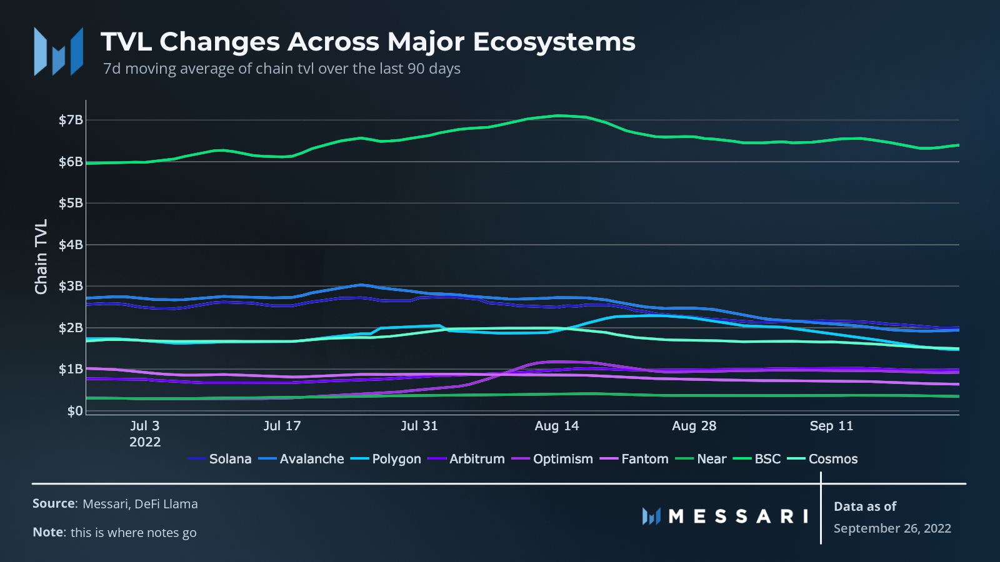

In [152]:
# == LINE CHART  
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.drop('Ethereum', axis=1).rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-line' 

# -- print chart 
chart.create_slide(chart_type = 'line', axis_title= 'Chain TVL', yaxis_data_type = 'dollar')
display(chart.slide)

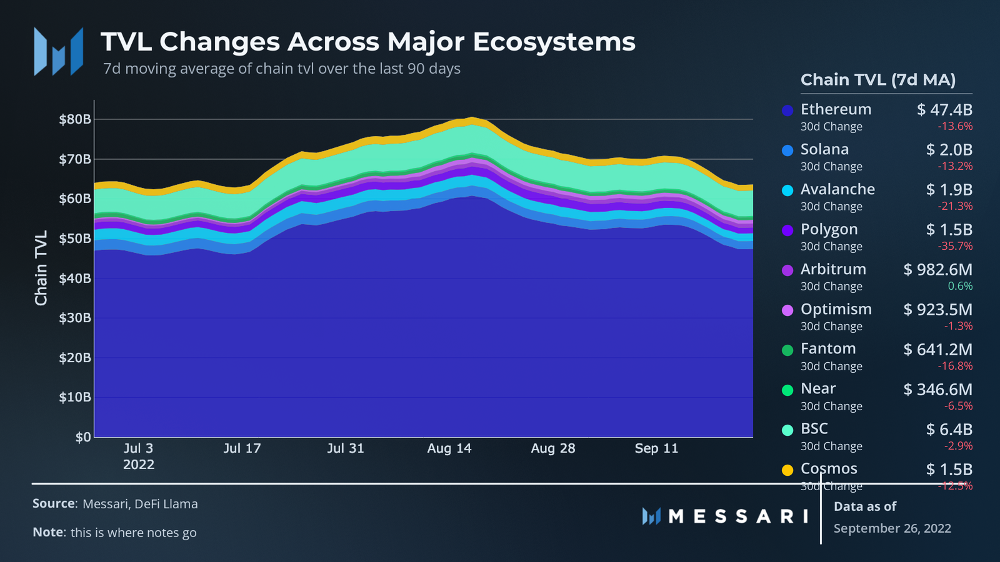

In [153]:
# == AREA CHART - RIGHT VALUES LEGEND
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-area-right_values'

# -- print chart 
chart.create_slide(chart_type = 'area', 
                    axis_title= 'Chain TVL',          # -- define y axis title 
                    yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                    legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                    legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                    digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

display(chart.slide)

# -- basic chart types 



options for variable: "chart_type" 
- **line**: (default) simple line chart for timeseries
- **area**: timeseries stacked area chart 
- **bar**: timeseries stacked bar chart 
- **bar_category**: category bar chart (labels on x axis )

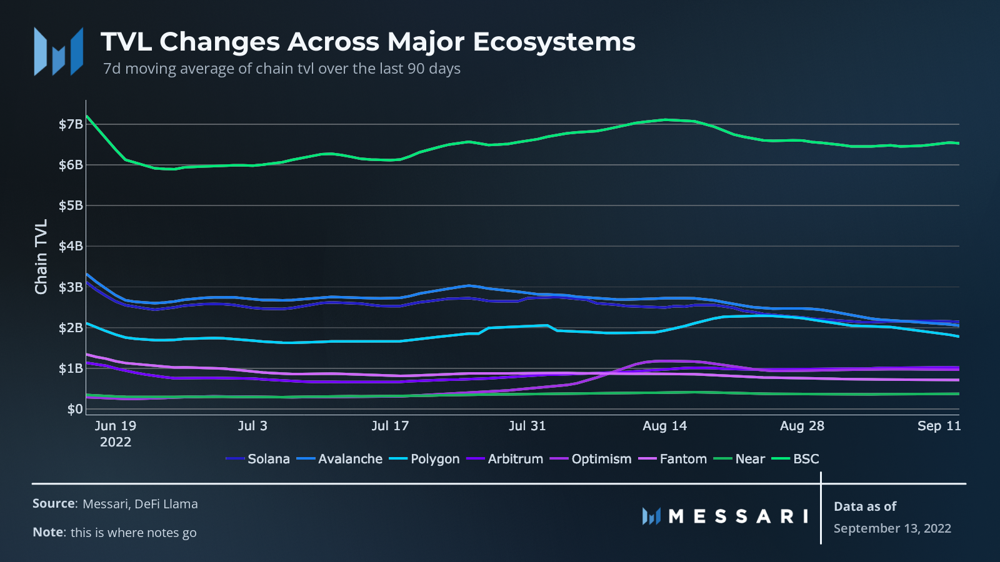

In [86]:
# == LINE CHART  
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.drop('Ethereum', axis=1).rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-line'

# -- print chart 
chart.create_slide(chart_type = 'line', axis_title= 'Chain TVL', yaxis_data_type = 'dollar')
display(chart.slide)

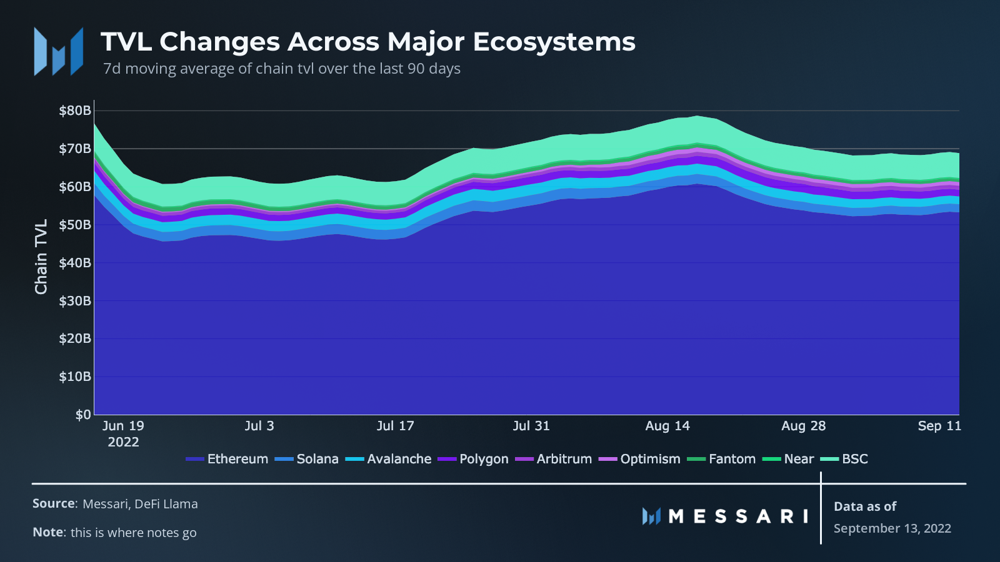

In [52]:
# == AREA CHART  
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-area'

# -- print chart 
chart.create_slide(chart_type = 'area', axis_title= 'Chain TVL', yaxis_data_type = 'dollar')
display(chart.slide)


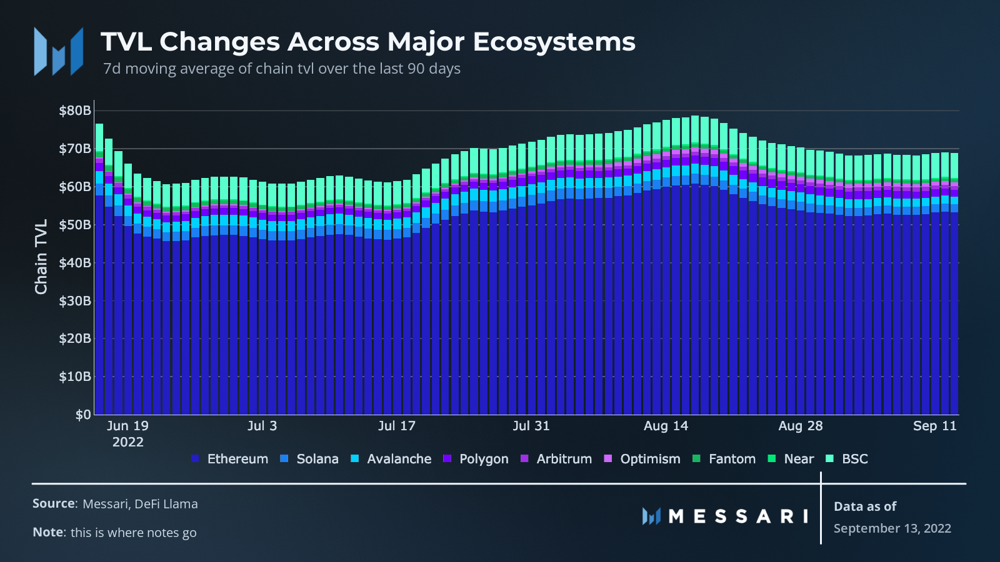

In [55]:
# == BAR CHART  
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-bar'

# -- print chart 
chart.create_slide(chart_type = 'bar', axis_title= 'Chain TVL', yaxis_data_type = 'dollar')
display(chart.slide)

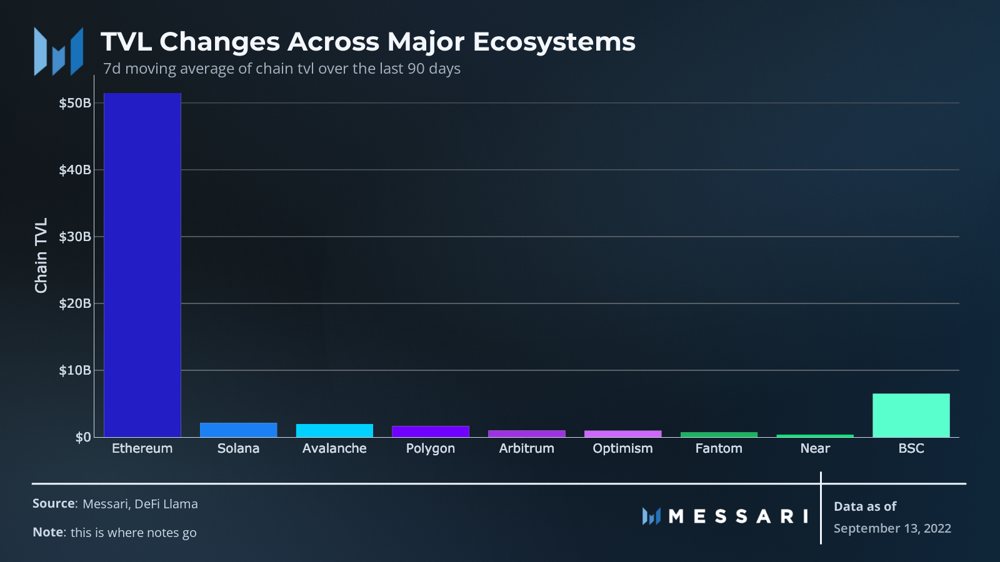

In [90]:
# == BAR CHART  
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.iloc[-1].to_frame()

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-bar-category'

# -- print chart 
chart.create_slide(chart_type = 'bar_category', axis_title= 'Chain TVL', yaxis_data_type = 'dollar', legend_layout = 'None')
display(chart.slide)

# -- Legend Types

options for variable: "legend_layout" 
- **bottom**: (default) standard legend on the bottom of the chart 
- **right**: standard legend to the right side of the chart 
- **right_values**: custom legend to the right. includes current and percent change values

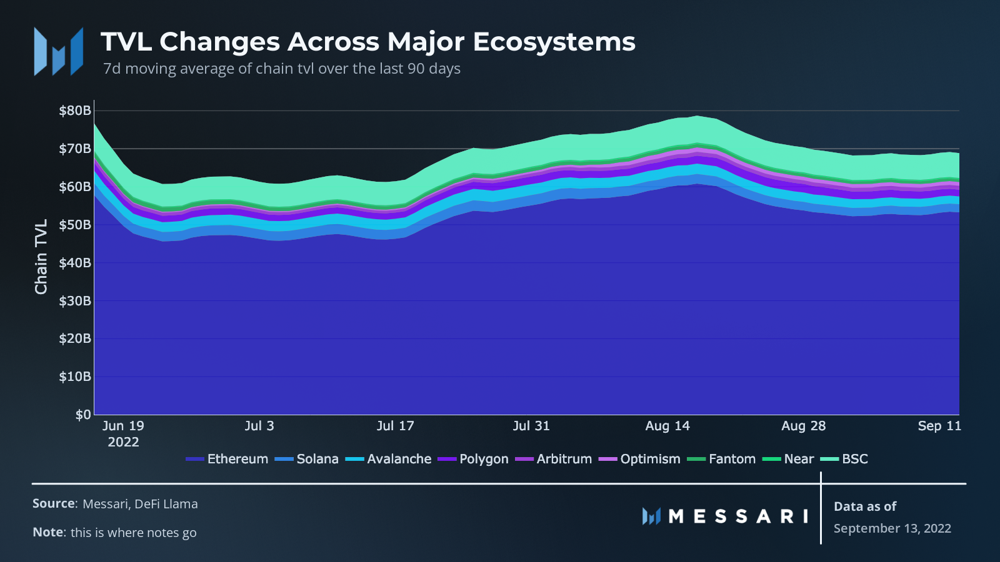

In [57]:
# == AREA CHART - BOTTOM LEGEND
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-area-bottom'

# -- print chart 
chart.create_slide(chart_type = 'area', 
                    axis_title= 'Chain TVL',          # -- define y axis title 
                    yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                    legend_layout = 'bottom',         # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                    #legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                    digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

display(chart.slide)

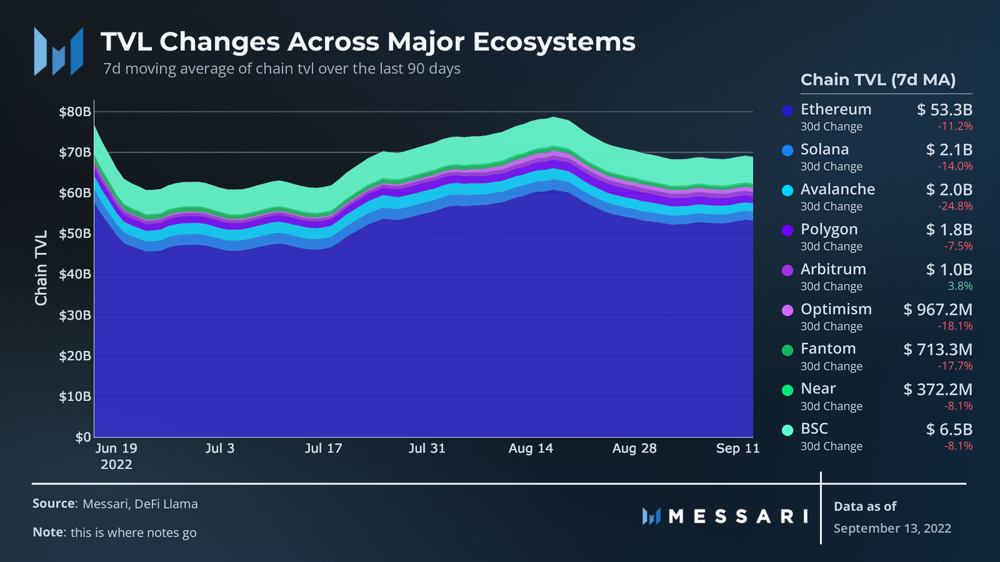

In [58]:
# == AREA CHART - RIGHT VALUES LEGEND
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-area-right_values'

# -- print chart 
chart.create_slide(chart_type = 'area', 
                    axis_title= 'Chain TVL',          # -- define y axis title 
                    yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                    legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                    legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                    digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

display(chart.slide)

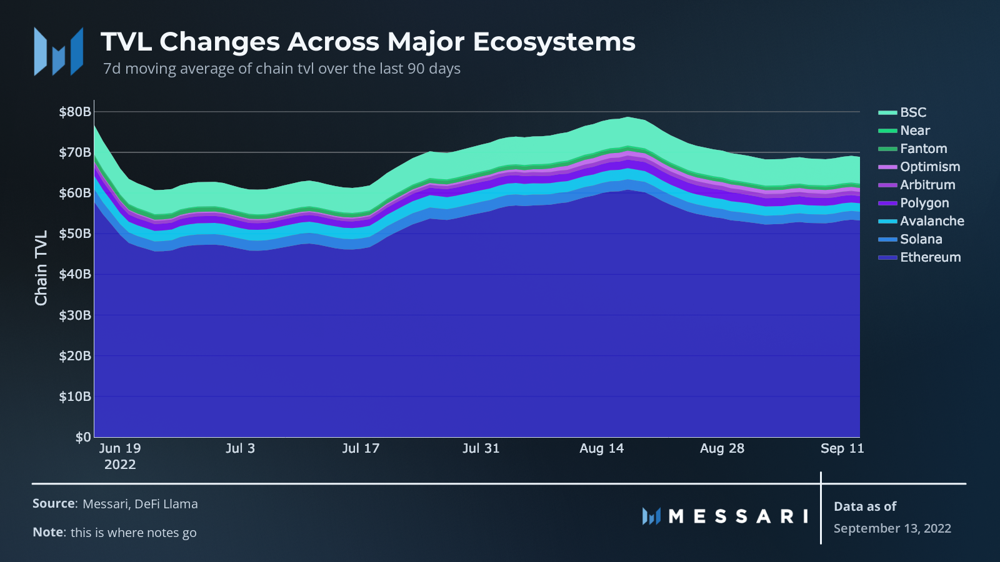

In [60]:
# == AREA CHART - RIGHT LEGEND
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-area-right'

# -- print chart 
chart.create_slide(chart_type = 'area', 
                    axis_title= 'Chain TVL',          # -- define y axis title 
                    yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                    legend_layout = 'right',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                    #legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                    digits=1)                         # -- defines the number of digits in the y axis and the legend (if right_values)

display(chart.slide)

# -- Secondary Axis 

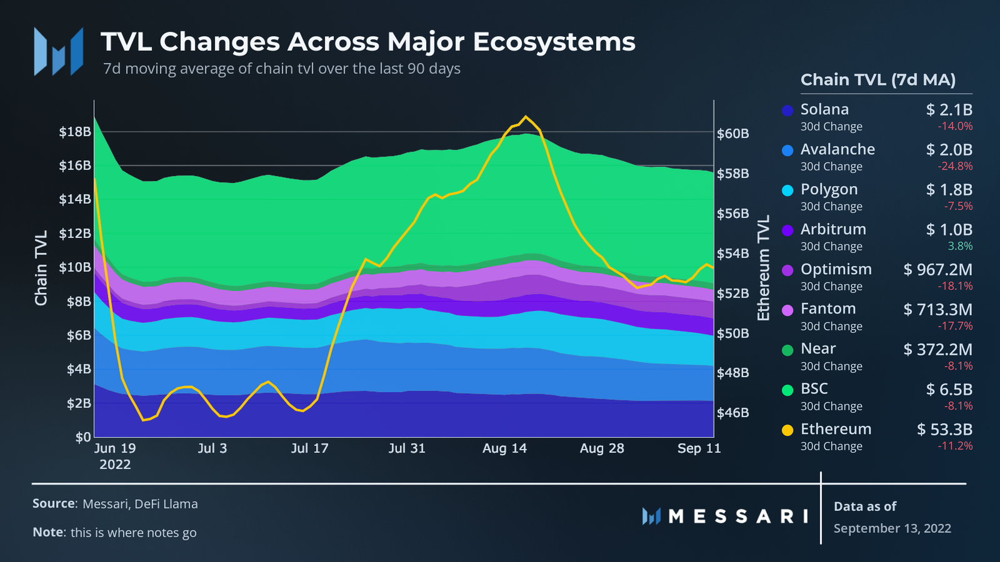

In [61]:
# == AREA CHART - SECOND AXIS $$
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls.rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-area-secondary'

# -- print chart 
chart.create_slide(chart_type = 'area', 
                    axis_title= 'Chain TVL',          # -- define y axis title 
                    yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                    legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                    legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                    digits=1,                         # -- defines the number of digits in the y axis and the legend (if right_values)
                    secondary_column = 'Ethereum',     # -- define which column to be the secondary axis 
                    secondary_axis_title = 'Ethereum TVL', # -- define the secondary axis title 
                    secondary_data_type= 'dollar'     # -- defines the data type of the secondary axis         
                    )                         

display(chart.slide)

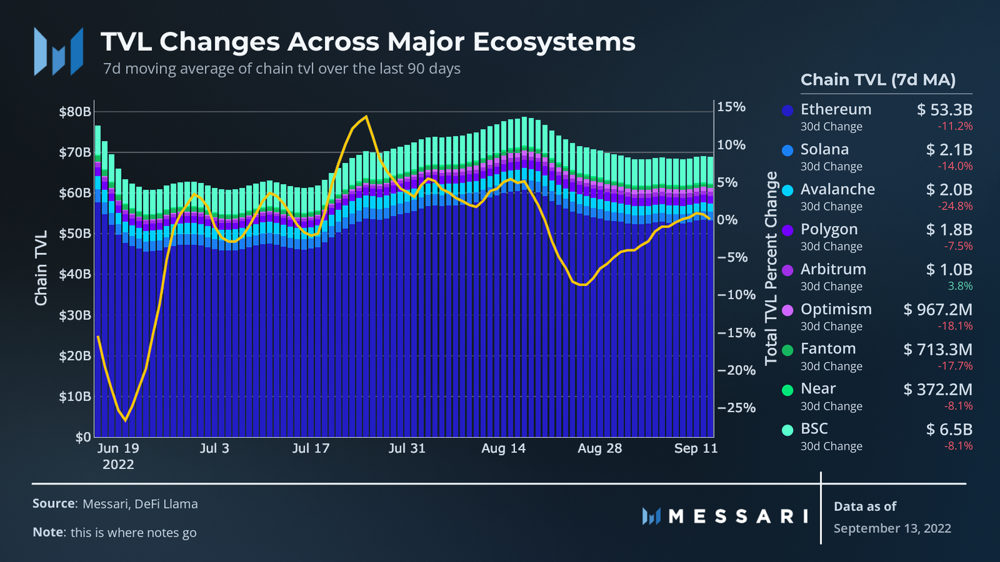

In [70]:
# == AREA CHART - SECONDARY AXIS %% Percent
# -- chain tvl over last 90d 

# -- filter df 
plot_df = chain_tvls
plot_df['total_tvl'] = plot_df.sum(axis=1)
plot_df['total_pct_chg'] = plot_df['total_tvl'].pct_change(7, fill_method='ffill')

plot_df = plot_df.drop('total_tvl', axis=1).rolling(7).mean().iloc[-90::]

# -- intialize chart object 
chart = messychart(plot_df)

# -- define titles 
chart.title = 'TVL Changes Across Major Ecosystems'
chart.subtitle = '7d moving average of chain tvl over the last 90 days'
chart.source = 'Messari, DeFi Llama'
chart.note = 'this is where notes go'
#chart.date = plot_df.index[-1].strftime('%B %d, %Y')

chart.filepath = '../charts/chain-tvl-area-secondary_percent'

# -- print chart 
chart.create_slide(chart_type = 'bar', 
                    axis_title= 'Chain TVL',          # -- define y axis title 
                    yaxis_data_type = 'dollar',       # -- defines the type: can be ['numeric', 'dollar', 'percent']. default is numeric 
                    legend_layout = 'right_values',   # -- defines the legend style and placement. options are ['bottom', 'right', 'right_values', 'None']
                    legend_title='Chain TVL (7d MA)', # -- defines legend title - only use with the "right" or "right_values" options 
                    digits=1,                         # -- defines the number of digits in the y axis and the legend (if right_values)
                    secondary_column = 'total_pct_chg',     # -- define which column to be the secondary axis 
                    secondary_axis_title = 'Total TVL Percent Change', # -- define the secondary axis title 
                    secondary_data_type= 'percent',   # -- defines the data type of the secondary axis
                    show_secondary = False            # -- controls whether to show item in legend 
                    )                         

display(chart.slide)